<a href="https://colab.research.google.com/github/IMindo/Single-cell-RNA-seq-in-a-choroid-plexus-from-a-multiple-sclerosis-mouse-model/blob/main/Projeto_Resultados.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import numpy as np
np.random.default_rng(2159)

PYTHONHASHSEED=0

In [2]:
!pip install scanpy

%matplotlib inline

#load packages
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sns
import gc
import os

sc.settings.verbosity = 3
sc.settings.set_figure_params(dpi=80)

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 17.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 122.4/122.4 kB 14.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.9/56.9 kB 7.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.7/85.7 kB 11.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.8/79.8 kB 10.5 MB/s eta 0:00:00
  Created wheel for session-info: filename=session_info-1.0.0-py3-none-any.whl size=8026 sha256=3bfff31b1f6e29c2ca770b3272b5fdfa22c20d492cb08a0663421be17d2d1dcd
  Stored in directory: /root/.cache/pip/wheels/6a/aa/b9/eb5d4031476ec10802795b97ccf937b9bd998d68a9b268765a
Successfully built session-info


In [3]:
ctl = sc.read_10x_h5('Control_filtered_feature_bc_matrix.h5')

reading Control_filtered_feature_bc_matrix.h5
 (0:00:00)


/usr/local/lib/python3.10/dist-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/usr/local/lib/python3.10/dist-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [4]:
eae = sc.read_10x_h5('EAE_filtered_feature_bc_matrix.h5')

reading EAE_filtered_feature_bc_matrix.h5
 (0:00:00)


/usr/local/lib/python3.10/dist-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/usr/local/lib/python3.10/dist-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [5]:
ctl.var_names_make_unique()
eae.var_names_make_unique()

In [6]:
ctl.obs['Condition'] = 'Control'
ctl.obs['Gender'] = 'Male'

eae.obs['Condition'] = 'EAE'
eae.obs['Gender'] = 'Male'

In [7]:
adata_dict = {'ctl': ctl, 'eae': eae}

for sample in adata_dict.keys():
     adata_dict[sample].obs['Condition'] = adata_dict[sample].obs['Condition'].astype('category')
     adata_dict[sample].obs['Gender'] = adata_dict[sample].obs['Gender'].astype('category')


In [8]:
ctl

AnnData object with n_obs × n_vars = 7594 × 32285
    obs: 'Condition', 'Gender'
    var: 'gene_ids', 'feature_types', 'genome'

In [9]:
eae

AnnData object with n_obs × n_vars = 5966 × 32285
    obs: 'Condition', 'Gender'
    var: 'gene_ids', 'feature_types', 'genome'

In [10]:
adata = ctl.concatenate(eae, batch_categories=['ctl', 'eae'])

<ipython-input-10-504a9eee8f32>:1: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  adata = ctl.concatenate(eae, batch_categories=['ctl', 'eae'])


In [11]:
adata.write("CP_CTL_MS_unfiltered.h5ad")

In [12]:
adata = sc.read_h5ad('CP_CTL_MS_unfiltered.h5ad')

In [13]:
adata

AnnData object with n_obs × n_vars = 13560 × 32285
    obs: 'Condition', 'Gender', 'batch'
    var: 'gene_ids', 'feature_types', 'genome'

In [14]:
adata.var_names_make_unique()
adata.obs_names_make_unique()

In [15]:
!pip install pybiomart

#add mito, ribo and hemo gene info
adata.var['Mito'] = adata.var_names.str.startswith('mt-')
adata.var['Ribo'] = adata.var_names.str.startswith(("Rps","Rpl"))
adata.var['Hb'] = adata.var_names.str.contains(("^Hb[^(p)]"))
#adata_merge.obs['n_counts'] = adata_merge.X.sum(axis = 1).A1
#adata_merge.obs['n_genes'] = np.sum(adata_merge.X > 0, 1)
sc.pp.calculate_qc_metrics(adata, qc_vars=['Mito','Ribo','Hb'], percent_top=None, log1p=False, inplace=True)

#Sample
annot = sc.queries.biomart_annotations(
        "mmusculus",
        ["ensembl_gene_id", "external_gene_name", "start_position", "end_position", "chromosome_name"],
    ).set_index("external_gene_name")

#sample sex
chrY_genes = adata.var_names.intersection(annot.index[annot.chromosome_name == "Y"])
adata.obs['percent_chrY'] = np.sum(adata[:, chrY_genes].X, axis=1).A1 / np.sum(adata.X, axis=1).A1 * 100
adata.obs["Xist-counts"] = adata.X[:,adata.var_names.str.match('Xist')].toarray()

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.4/61.4 kB 1.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.5/57.5 kB 5.0 MB/s eta 0:00:00


In [16]:
adata.raw = adata

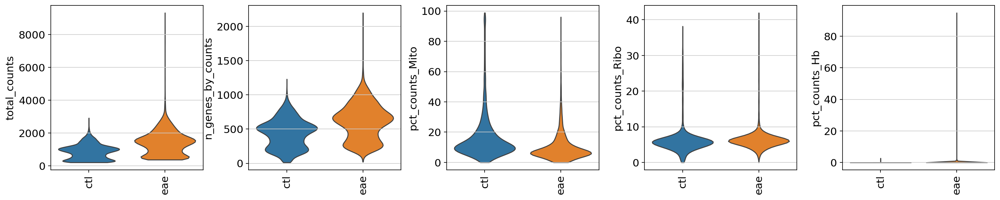

In [17]:
sc.pl.violin(adata, keys=['total_counts','n_genes_by_counts','pct_counts_Mito','pct_counts_Ribo','pct_counts_Hb'],
             rotation=90,stripplot=False,groupby='batch')

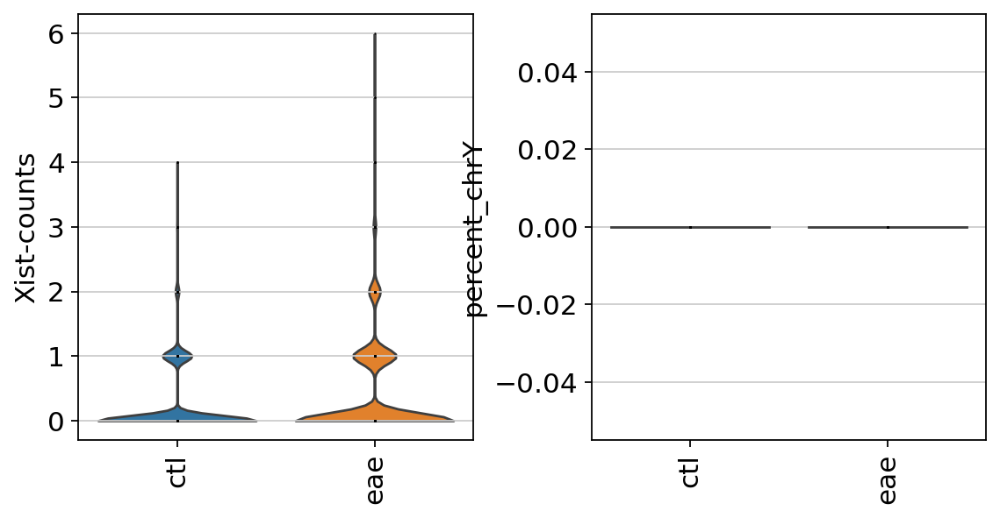

In [18]:
sc.pl.violin(adata, ["Xist-counts", "percent_chrY"], jitter=0, groupby = 'batch', rotation= 90)

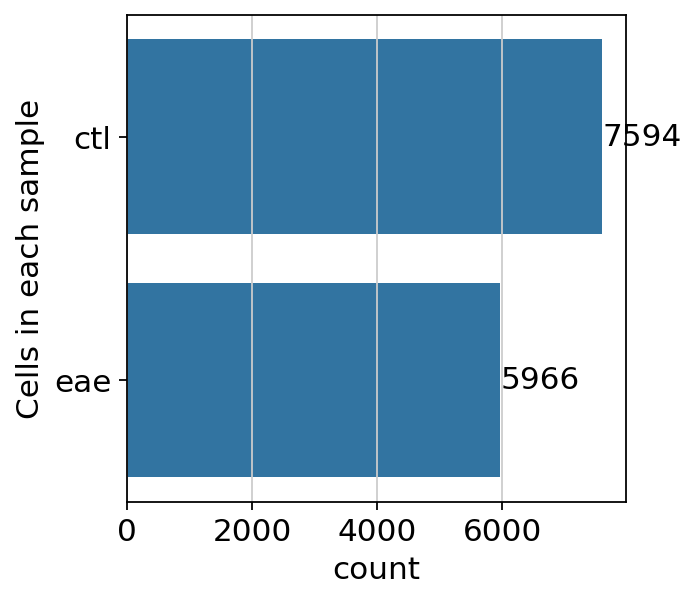

In [19]:
#sns.set_context("paper", rc={"font.size":8,"axes.titlesize":12,"axes.labelsize":8})
ax = sns.countplot(y = 'batch',data = adata.obs)
ax.set_ylabel('Cells in each sample')

for container in ax.containers:
    ax.bar_label(container)

normalizing counts per cell
    finished (0:00:00)


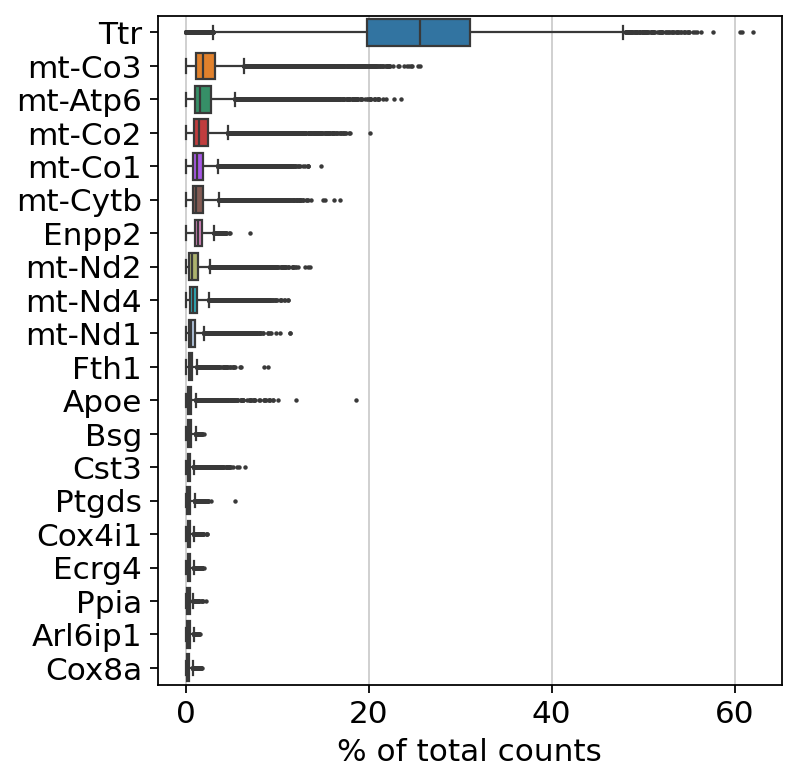

In [20]:
sc.pl.highest_expr_genes(adata,n_top=20)

In [21]:
adata.write_h5ad('CP_CTL_MS_unfiltered_2.h5ad')

In [22]:
## normalize to depth 10 000
sc.pp.normalize_per_cell(adata,counts_per_cell_after=1e4)

## logaritmize
sc.pp.log1p(adata)

normalizing by total count per cell
    finished (0:00:02): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


In [23]:
!pip install scrublet

##  Predict doublets
import scrublet as scr

scrub = scr.Scrublet(adata.raw.X)
doublet_score, predicted_doublets = scrub.scrub_doublets()

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 647.5/647.5 kB 5.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for annoy: filename=annoy-1.17.3-cp310-cp310-linux_x86_64.whl size=552449 sha256=4e085cdd9ca2272f33e2ae82d8bcb0b57e0057c08ad3224219835a775ac07da6
  Stored in directory: /root/.cache/pip/wheels/64/8a/da/f714bcf46c5efdcfcac0559e63370c21abe961c48e3992465a
Successfully built annoy
Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.43
Detected doublet rate = 0.3%
Estimated detectable doublet fraction = 2.7%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 10.9%
Elapsed time: 23.3 seconds


In [24]:
%matplotlib inline

(<Figure size 640x240 with 2 Axes>,
 array([<Axes: title={'center': 'Observed transcriptomes'}, xlabel='Doublet score', ylabel='Prob. density'>,
        <Axes: title={'center': 'Simulated doublets'}, xlabel='Doublet score', ylabel='Prob. density'>],
       dtype=object))

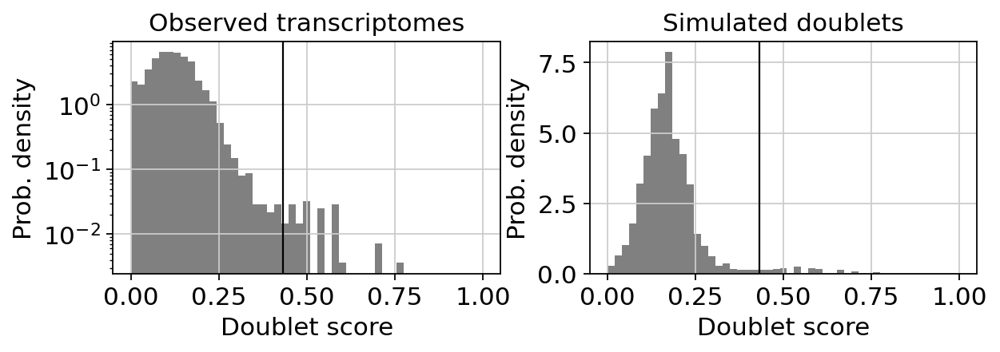

In [25]:
scrub.plot_histogram()

In [26]:
predicted_doublets = scrub.call_doublets(threshold=0.43)

Detected doublet rate = 0.3%
Estimated detectable doublet fraction = 3.0%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 10.9%


(<Figure size 640x240 with 2 Axes>,
 array([<Axes: title={'center': 'Observed transcriptomes'}, xlabel='Doublet score', ylabel='Prob. density'>,
        <Axes: title={'center': 'Simulated doublets'}, xlabel='Doublet score', ylabel='Prob. density'>],
       dtype=object))

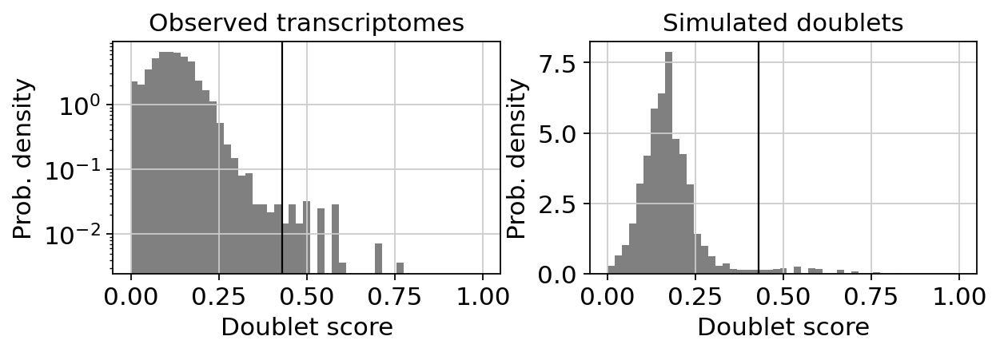

In [27]:
scrub.plot_histogram()

In [28]:
adata.obs['predicted_doublets'] = predicted_doublets

In [29]:
sum(adata.obs['predicted_doublets'])

44

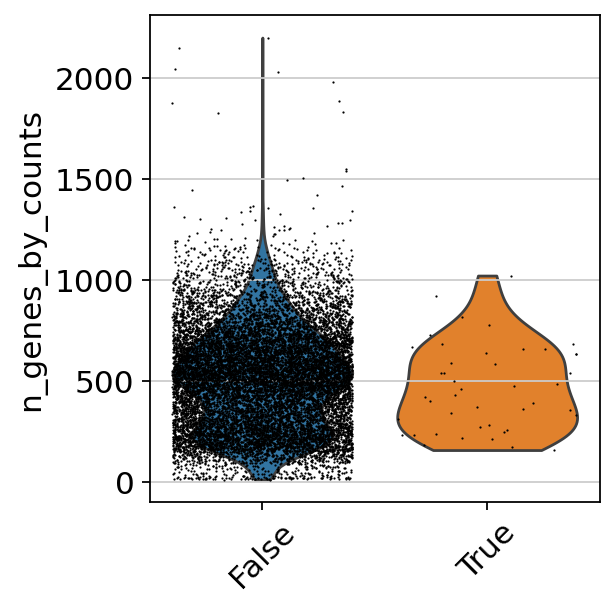

In [30]:
## add in column with singlet/doublet instead of True/False
adata.obs['doublet_info'] = adata.obs["predicted_doublets"].astype(str)
sc.pl.violin(adata, 'n_genes_by_counts', jitter=0.4, groupby = 'doublet_info', rotation=45)



computing PCA
    with n_comps=50
    finished (0:00:51)
computing neighbors
    using 'X_pca' with n_pcs = 30
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:01:16)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:10)


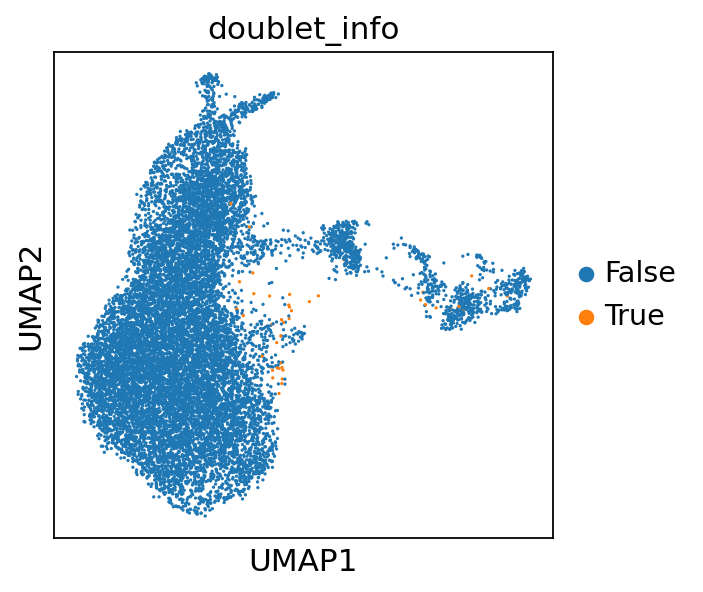

In [31]:
sc.tl.pca(adata, svd_solver='arpack')
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=30)
sc.tl.umap(adata)

sc.pl.umap(adata, sort_order=True, color=['doublet_info'])

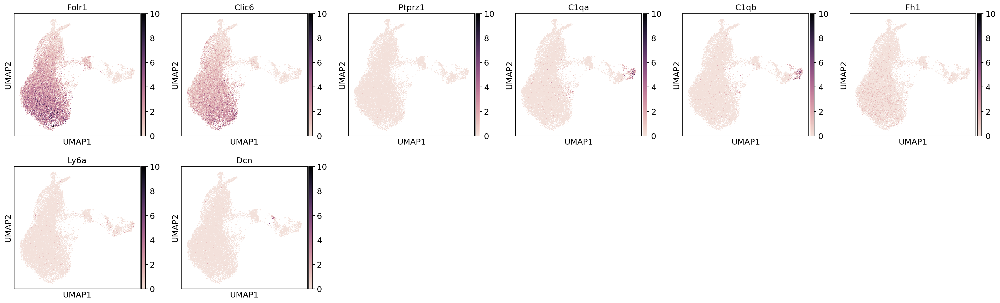

In [32]:
#check the expression of top markers of each cell type
sc.pl.umap(adata,color=['Folr1', 'Clic6', 'Ptprz1', 'C1qa', 'C1qb', 'Fh1', 'Ly6a', 'Dcn'],ncols=6,cmap=sns.cubehelix_palette(dark=0, light=.9, as_cmap=True), use_raw=True,
           vmax=10)

In [33]:
adata = adata[adata.obs['doublet_info'] == 'False',:]
print(adata.shape)

(13516, 32285)


In [34]:
sc.pp.filter_cells(adata,min_genes = 300)
sc.pp.filter_genes(adata,min_cells = 3)

filtered out 3202 cells that have less than 300 genes expressed


/usr/local/lib/python3.10/dist-packages/scanpy/preprocessing/_simple.py:160: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs["n_genes"] = number


filtered out 17978 genes that are detected in less than 3 cells


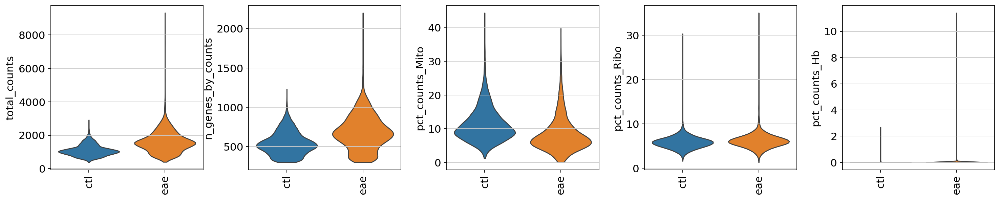

In [35]:
sc.pl.violin(adata, keys=['total_counts','n_genes_by_counts','pct_counts_Mito','pct_counts_Ribo','pct_counts_Hb'],
             rotation=90,stripplot=False,groupby='batch')

In [36]:
adata = adata[adata.obs['total_counts'] < 4000,:]

In [37]:
adata = adata[adata.obs['n_genes_by_counts'] < 1500, :]

In [38]:
adata = adata[adata.obs['pct_counts_Mito'] < 35,:]

In [39]:
adata = adata[adata.obs['pct_counts_Hb'] < 0.05,:]

In [40]:
adata = adata[adata.obs['pct_counts_Ribo'] < 15,:]

In [41]:
sc.pp.filter_cells(adata,max_genes = 5000)
sc.pp.filter_cells(adata,max_counts = 2000)

filtered out 141 cells that have more than 2000 counts


/usr/local/lib/python3.10/dist-packages/scanpy/preprocessing/_simple.py:160: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs["n_genes"] = number


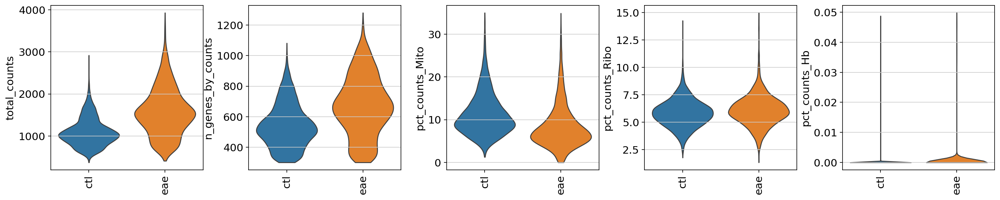

In [42]:
sc.pl.violin(adata, keys=['total_counts','n_genes_by_counts','pct_counts_Mito','pct_counts_Ribo','pct_counts_Hb'],
             rotation=90,stripplot=False,groupby='batch')

In [43]:
print("Remaining cells %d" % adata.n_obs)

Remaining cells 9629


In [44]:
adata

AnnData object with n_obs × n_vars = 9629 × 14307
    obs: 'Condition', 'Gender', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_Mito', 'pct_counts_Mito', 'total_counts_Ribo', 'pct_counts_Ribo', 'total_counts_Hb', 'pct_counts_Hb', 'percent_chrY', 'Xist-counts', 'n_counts', 'predicted_doublets', 'doublet_info', 'n_genes'
    var: 'gene_ids', 'feature_types', 'genome', 'Mito', 'Ribo', 'Hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells'
    uns: 'batch_colors', 'log1p', 'doublet_info_colors', 'pca', 'neighbors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [45]:
adata.write_h5ad('2_CP_CTL_MS_filtered.h5ad')

In [46]:
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.45)
print("Highly variable genes: %d"%sum(adata.var.highly_variable))

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
Highly variable genes: 1020


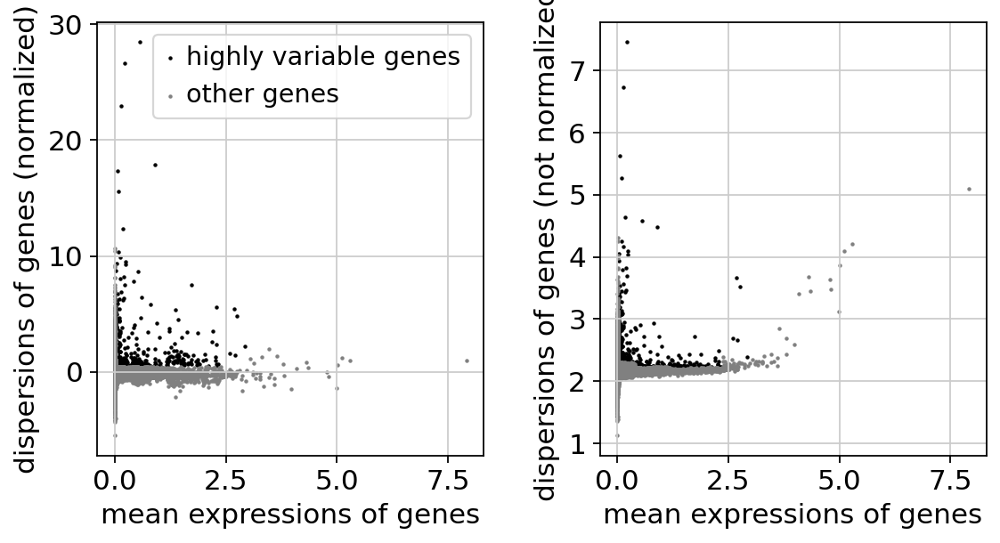

In [47]:
#plot variable genes
sc.pl.highly_variable_genes(adata)

In [48]:
adata_all_genes = adata[:, adata.var['highly_variable']]

In [49]:
adata_all_genes

View of AnnData object with n_obs × n_vars = 9629 × 1020
    obs: 'Condition', 'Gender', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_Mito', 'pct_counts_Mito', 'total_counts_Ribo', 'pct_counts_Ribo', 'total_counts_Hb', 'pct_counts_Hb', 'percent_chrY', 'Xist-counts', 'n_counts', 'predicted_doublets', 'doublet_info', 'n_genes'
    var: 'gene_ids', 'feature_types', 'genome', 'Mito', 'Ribo', 'Hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'batch_colors', 'log1p', 'doublet_info_colors', 'pca', 'neighbors', 'umap', 'hvg'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [50]:
adata = adata[:, adata_all_genes.var_names]

In [51]:
adata

View of AnnData object with n_obs × n_vars = 9629 × 1020
    obs: 'Condition', 'Gender', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_Mito', 'pct_counts_Mito', 'total_counts_Ribo', 'pct_counts_Ribo', 'total_counts_Hb', 'pct_counts_Hb', 'percent_chrY', 'Xist-counts', 'n_counts', 'predicted_doublets', 'doublet_info', 'n_genes'
    var: 'gene_ids', 'feature_types', 'genome', 'Mito', 'Ribo', 'Hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'batch_colors', 'log1p', 'doublet_info_colors', 'pca', 'neighbors', 'umap', 'hvg'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [52]:
sc.pp.scale(adata,max_value=10)

... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


/usr/local/lib/python3.10/dist-packages/scanpy/preprocessing/_scale.py:299: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


computing PCA
    with n_comps=50
    finished (0:00:06)


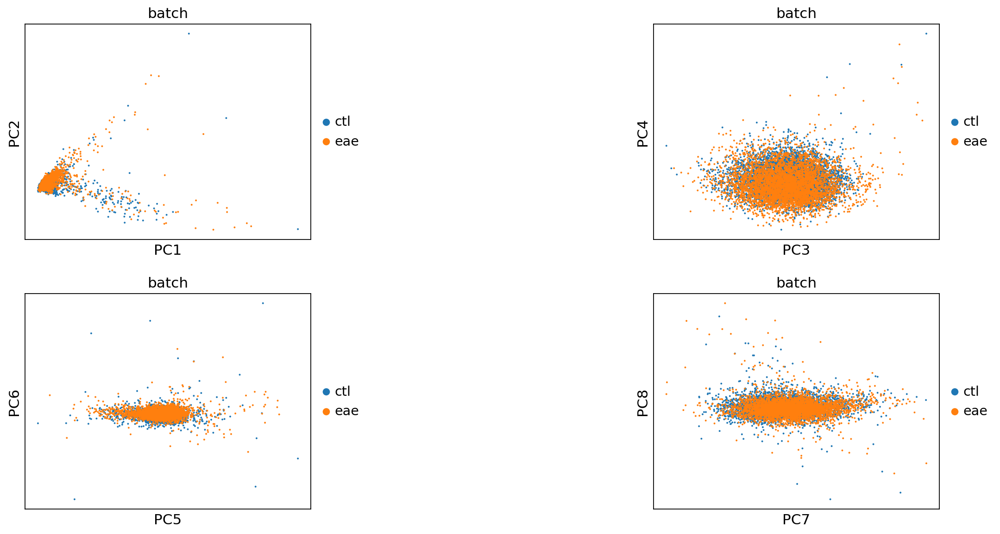

In [53]:
sc.tl.pca(adata, svd_solver='arpack')

sc.pl.pca(adata, color='batch', components = ['1,2','3,4','5,6','7,8'], ncols=2, wspace=1)

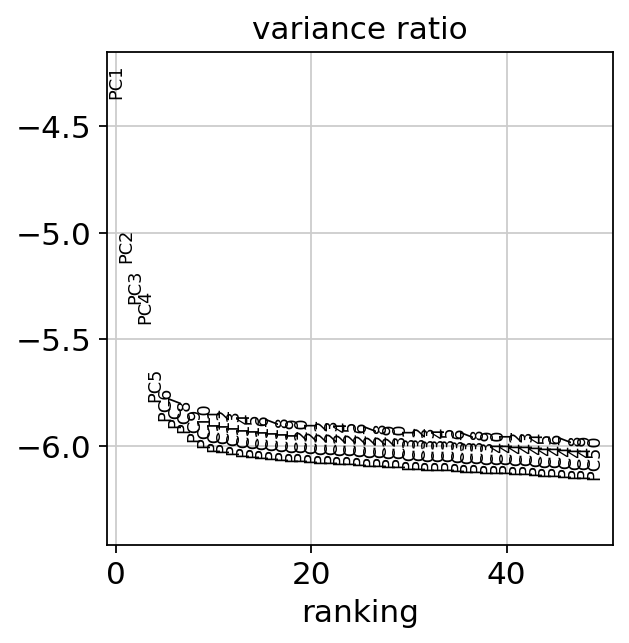

In [54]:
sc.pl.pca_variance_ratio(adata, log=True, n_pcs=50)

In [55]:
sc.pp.neighbors(adata, n_pcs=40)
sc.tl.umap(adata)

computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:03)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:21)


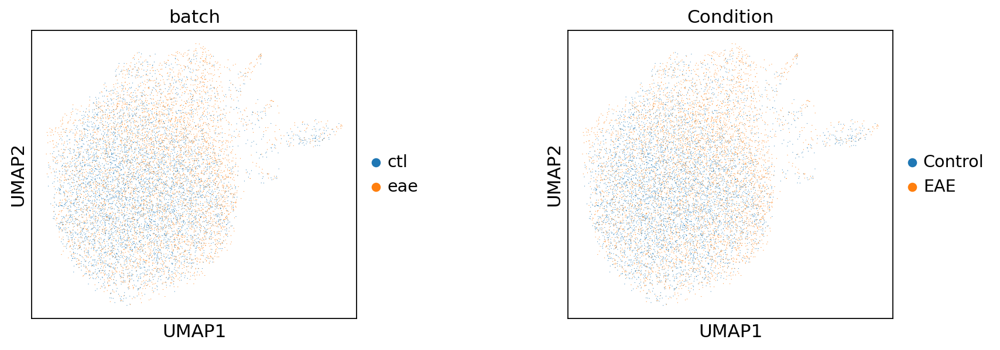

In [56]:
sc.pl.umap(adata, color=["batch", "Condition"], size=1, wspace=0.5)

In [57]:

!pip install harmonize

!pip install harmony-pytorch
from harmony import harmonize


  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.4/194.4 kB 4.0 MB/s eta 0:00:00
  Created wheel for harmonize: filename=harmonize-1.0.2-py3-none-any.whl size=6413 sha256=79f52cd9d3160e6ae6b56dd764244896f01487faea03c077cc280bd73dbacc2b
  Stored in directory: /root/.cache/pip/wheels/6d/8d/1f/c6fccfb15ae8d90458696a166466218c34f795526370657a0c
Successfully built harmonize
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x8

In [58]:
Z = harmonize(adata.obsm['X_pca'], adata.obs, batch_key = 'batch')
adata.obsm['X_harmony'] = Z

	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
	Completed 3 / 10 iteration(s).
	Completed 4 / 10 iteration(s).
	Completed 5 / 10 iteration(s).
	Completed 6 / 10 iteration(s).
	Completed 7 / 10 iteration(s).
	Completed 8 / 10 iteration(s).
Reach convergence after 8 iteration(s).


In [59]:
print("Calculating UMAP")
sc.pp.neighbors(adata, n_pcs=40, use_rep="X_harmony")
sc.tl.umap(adata)


Calculating UMAP
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:08)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:40)


Ploting UMAP


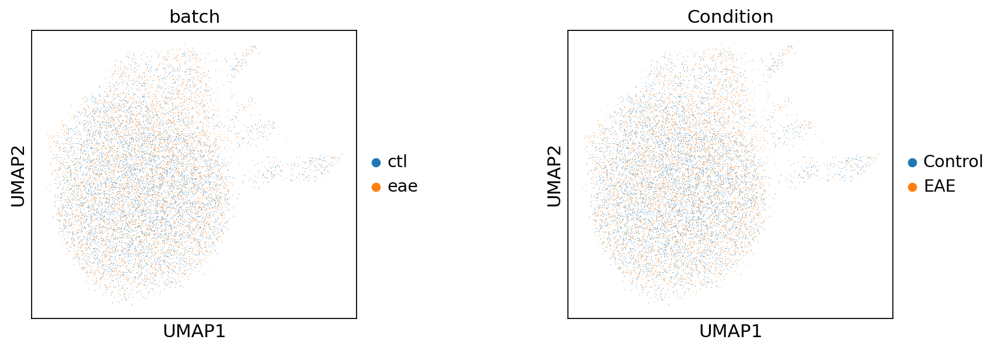

In [60]:
print("Ploting UMAP")
sc.pl.umap(adata, color=["batch", 'Condition'], size=1, wspace=0.5)

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 20.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 16.5 MB/s eta 0:00:00
running Leiden clustering


<ipython-input-62-24f1860a0495>:5: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata, resolution=res,key_added = 'leiden_%s'%res)


    finished: found 2 clusters and added
    'leiden_0.1', the cluster labels (adata.obs, categorical) (0:00:03)
running Leiden clustering
    finished: found 2 clusters and added
    'leiden_0.3', the cluster labels (adata.obs, categorical) (0:00:04)
running Leiden clustering
    finished: found 8 clusters and added
    'leiden_0.8', the cluster labels (adata.obs, categorical) (0:00:18)


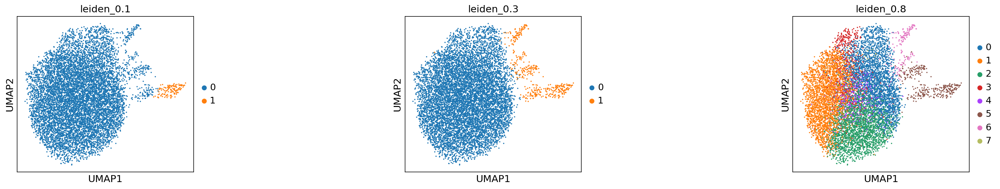

In [62]:
!pip3 install igraph
!pip3 install leidenalg
# clustering
for res in [0.1, 0.3, 0.8]:
    sc.tl.leiden(adata, resolution=res,key_added = 'leiden_%s'%res)
#plot
sc.pl.umap(adata,color=['leiden_0.1','leiden_0.3', 'leiden_0.8'], ncols=4, wspace=1)

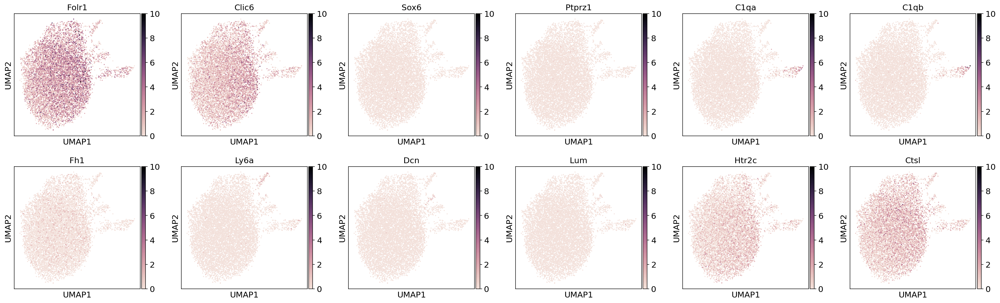

In [63]:
# check the expression of top markers of each cell type
sc.pl.umap(adata,color=['Folr1', 'Clic6', 'Sox6', 'Ptprz1', 'C1qa', 'C1qb', 'Fh1', 'Ly6a', 'Dcn', 'Lum',
                        'Htr2c','Ctsl'],ncols=6,cmap=sns.cubehelix_palette(dark=0, light=.9, as_cmap=True), use_raw=True,
           vmax=10)

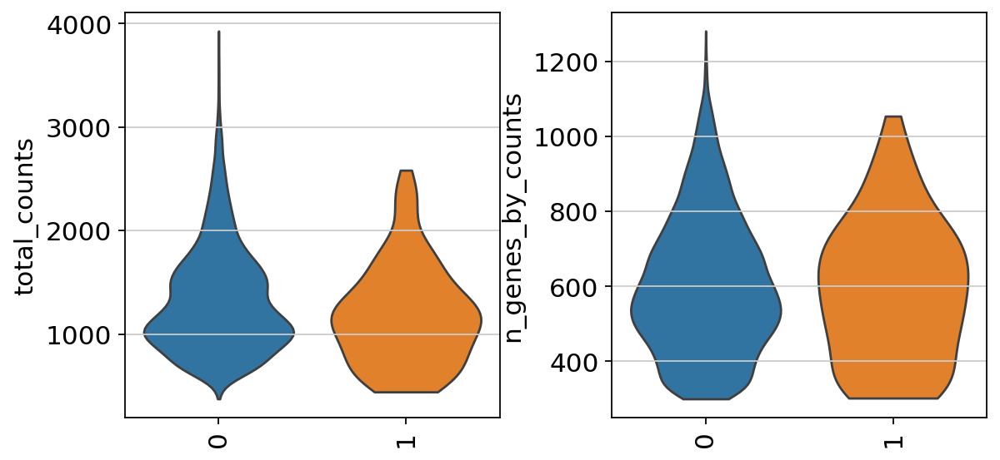

In [64]:
sc.pl.violin(adata, keys=['total_counts','n_genes_by_counts'],
             rotation=90,stripplot=False,groupby='leiden_0.1')

In [65]:
sc.tl.rank_genes_groups(adata, 'leiden_0.1', method='wilcoxon', key_added = "wilcoxon_01", use_raw=True)

ranking genes
    finished: added to `.uns['wilcoxon_01']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:45)


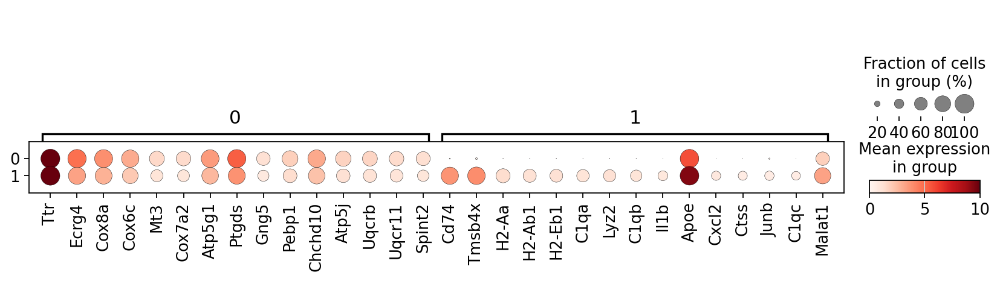

In [66]:
sc.pl.rank_genes_groups_dotplot(adata, n_genes=15, key="wilcoxon_01" , groupby="leiden_0.1", cmap="Reds", vmin=0, vmax=10)

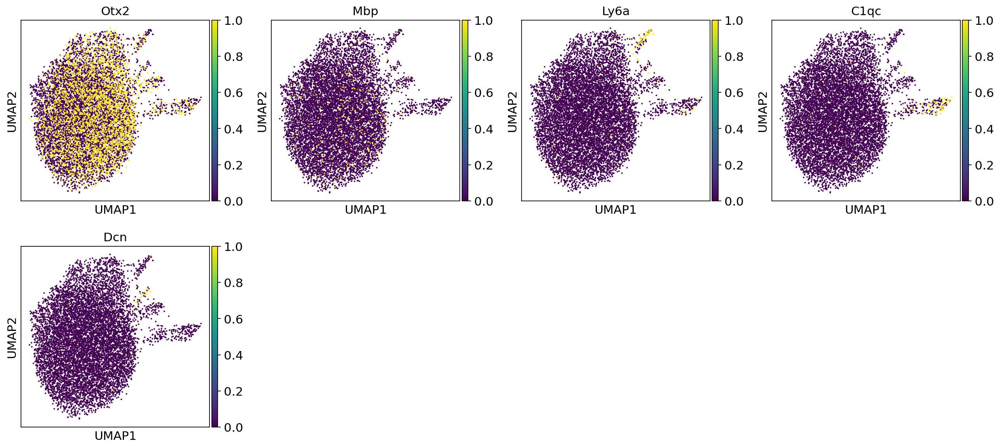

In [67]:
sc.pl.umap(adata,color=['Otx2','Mbp','Ly6a','C1qc',
                         'Dcn',], vmax=1, use_raw=True)
#Epithelial, Neuronal/Glial, Endothelial, Immune, Mesenchymal

In [68]:
dani_markers = {'Epithelial': ['Otx2', 'Folr1', 'Clic6','Ttr','Cab39l','Krt15'],
                'Immune': ['C1qc', 'C1qa', 'C1qb', 'Fcer1g']}

Epithelial ------------------------------------------------------------------------------------------


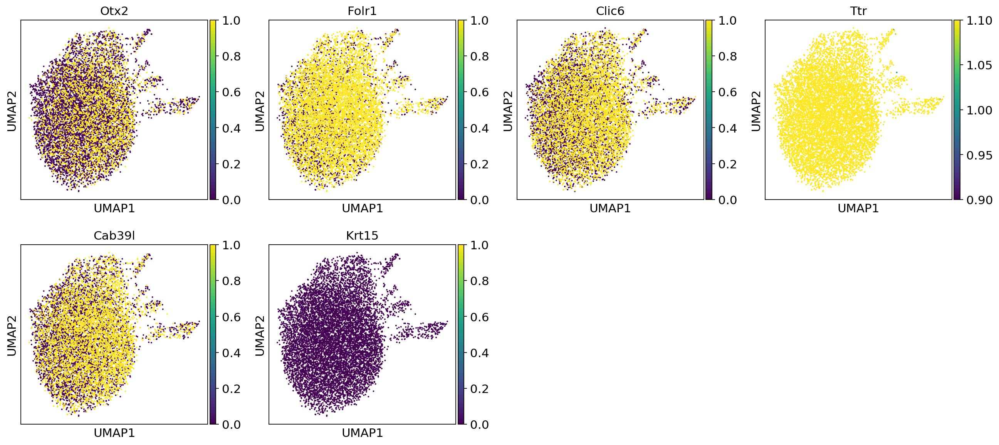

Immune ------------------------------------------------------------------------------------------


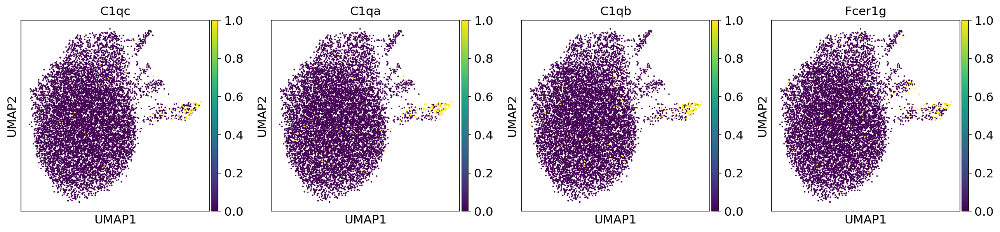

In [69]:
for k, v in dani_markers.items():
    genes_in_data = []
    for gene in v:
        if gene in adata.raw.var_names:
            genes_in_data.append(gene)
    print(f"{k} {'-'*90}")
    sc.pl.umap(adata, color=genes_in_data, use_raw=True, ncols=4, vmax=1)

In [70]:
adata.write_h5ad('2_CP_CTL_MS_clustered.h5ad')

In [71]:
adata = sc.read_h5ad('2_CP_CTL_MS_clustered.h5ad')

In [72]:
adata


AnnData object with n_obs × n_vars = 9629 × 1020
    obs: 'Condition', 'Gender', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_Mito', 'pct_counts_Mito', 'total_counts_Ribo', 'pct_counts_Ribo', 'total_counts_Hb', 'pct_counts_Hb', 'percent_chrY', 'Xist-counts', 'n_counts', 'predicted_doublets', 'doublet_info', 'n_genes', 'leiden_0.1', 'leiden_0.3', 'leiden_0.8'
    var: 'gene_ids', 'feature_types', 'genome', 'Mito', 'Ribo', 'Hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'Condition_colors', 'batch_colors', 'doublet_info_colors', 'hvg', 'leiden_0.1', 'leiden_0.1_colors', 'leiden_0.3', 'leiden_0.3_colors', 'leiden_0.8', 'leiden_0.8_colors', 'log1p', 'neighbors', 'pca', 'umap', 'wilcoxon_01'
    obsm: 'X_harmony', 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [73]:
adata.obs["Cell_type"] = adata.obs["leiden_0.1"].replace({"0": "Epithelial",
                                                          "1": "Immune Cells"})

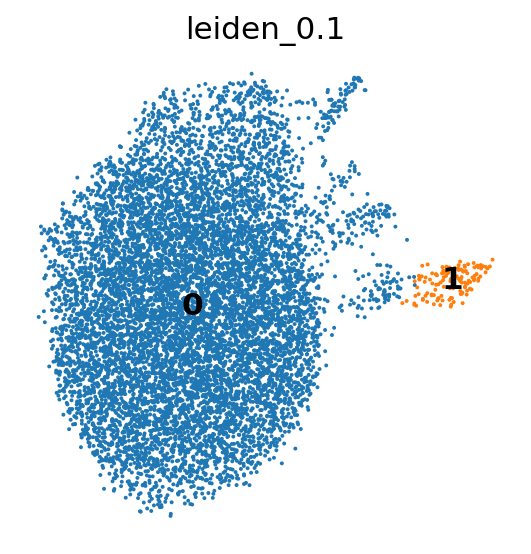

In [74]:
sc.pl.umap(adata, color = ['leiden_0.1'], frameon = False, legend_loc = "on data")

In [75]:
print(adata.var_names)


Index(['Prex2', 'Sulf1', 'Paqr8', 'Prim2', 'Hs6st1', 'Sema4c', 'Inpp4a',
       'Rev1', 'Ercc5', 'Nabp1',
       ...
       'Htr2c', 'Spin2c', 'Rps6ka3', 'Tmsb4x', 'Gm47283', 'mt-Atp8', 'mt-Nd3',
       'mt-Nd4l', 'mt-Nd5', 'mt-Nd6'],
      dtype='object', length=1020)


In [76]:
adata.uns['log1p']["base"] = None

In [77]:
sc.tl.rank_genes_groups(adata, 'Cell_type', method='wilcoxon', key_added = "wilcoxon_Cell_type", use_raw=True)

ranking genes
    finished: added to `.uns['wilcoxon_Cell_type']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:47)


In [78]:
sc.tl.dendrogram(adata, 'Cell_type')

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_Cell_type']`


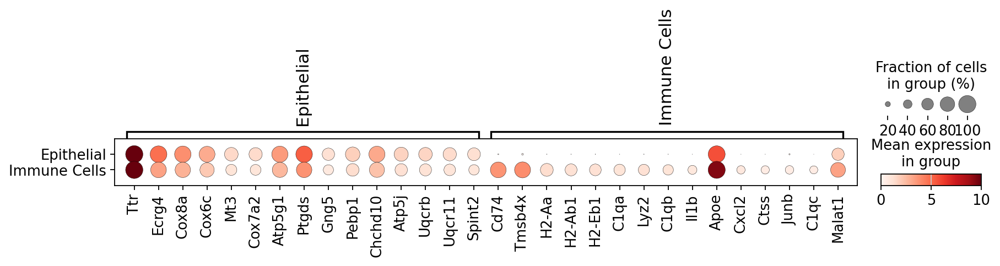

In [79]:
sc.pl.rank_genes_groups_dotplot(adata, n_genes=15, key="wilcoxon_Cell_type" , groupby="Cell_type", cmap="Reds", vmin=0, vmax=10)

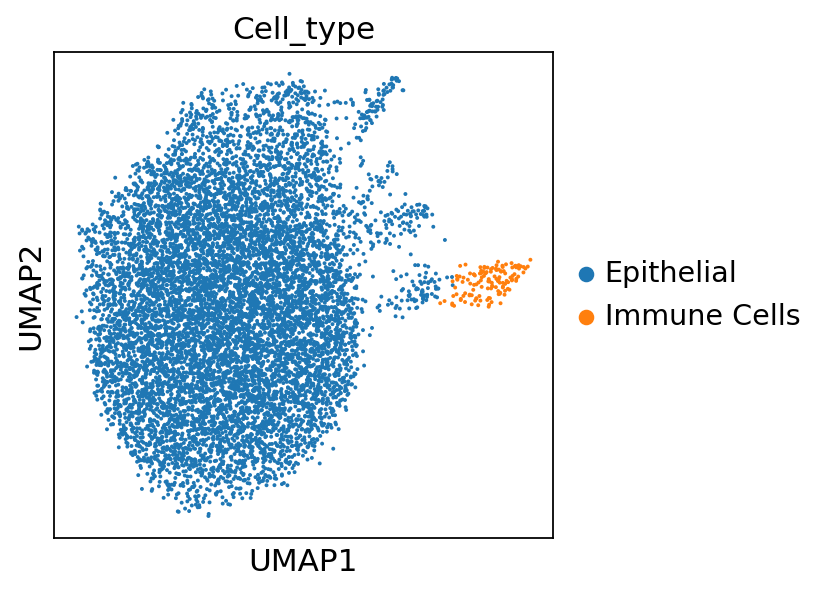

In [80]:
sc.pl.umap(adata, color=["Cell_type"])

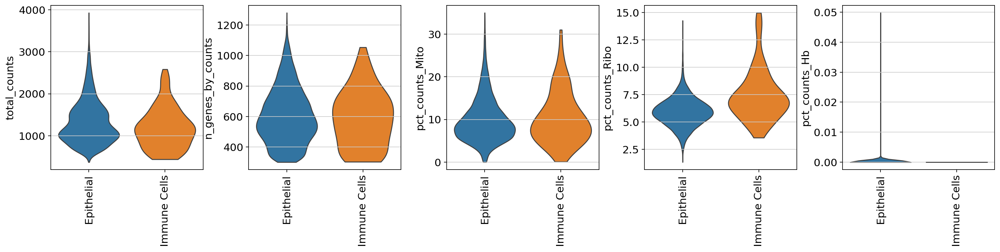

In [81]:
sc.pl.violin(adata, ['total_counts','n_genes_by_counts','pct_counts_Mito','pct_counts_Ribo','pct_counts_Hb'],
             groupby="Cell_type", rotation=90, stripplot=False)

In [82]:
sc.tl.rank_genes_groups(adata, groupby="Cell_type", method='wilcoxon', n_genes=200)

clust_df = pd.DataFrame(adata.uns['rank_genes_groups']['names'])
clust_df.to_csv( "Top_200_marker_genes_CP_CTL_AD.csv")

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:46)


In [83]:
cell_type_colors = adata.uns['Cell_type_colors']

<ipython-input-84-561c688ad3ff>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y = 'batch',data = adata.obs,ax=ax1, palette='deep')
<ipython-input-84-561c688ad3ff>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y = 'Cell_type',data = adata.obs,ax=ax2, palette=cell_type_colors)


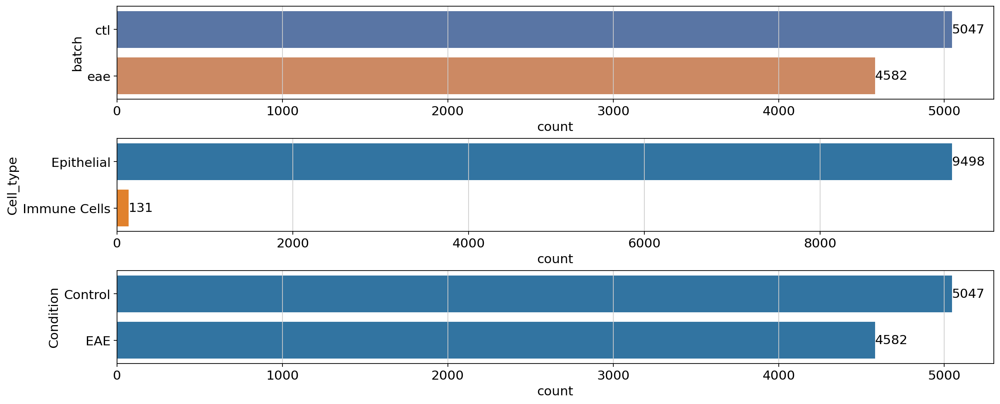

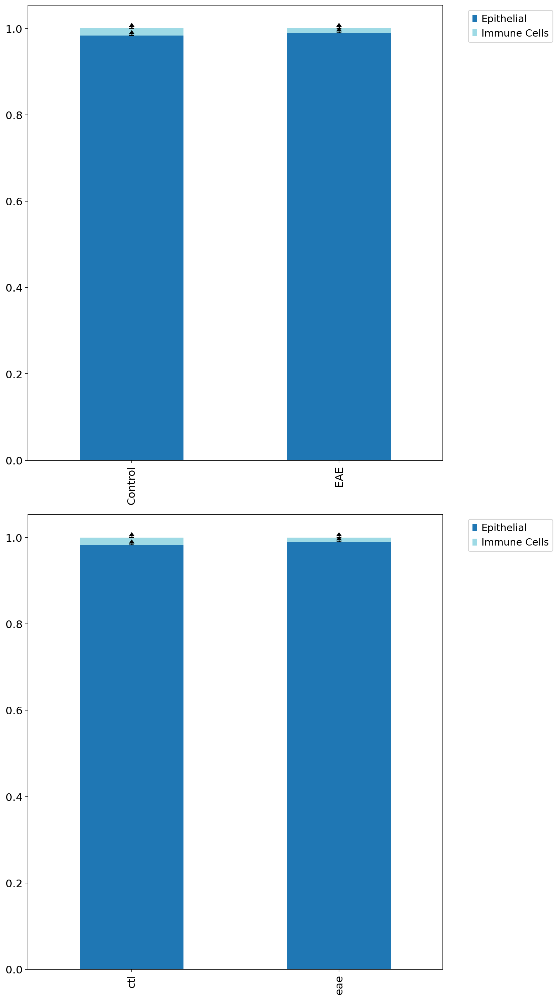

In [84]:
fig, (ax1,ax2,ax3) = plt.subplots(nrows=3,ncols=1,constrained_layout=True,figsize=(15,6))
sns.countplot(y = 'batch',data = adata.obs,ax=ax1, palette='deep')
for container in ax1.containers:
    ax1.bar_label(container)

sns.countplot(y = 'Cell_type',data = adata.obs,ax=ax2, palette=cell_type_colors)
for container in ax2.containers:
    ax2.bar_label(container)

sns.countplot(y = 'Condition',data = adata.obs,ax=ax3)
for container in ax3.containers:
    ax3.bar_label(container)

def batch_pct_cellType(adata_file,groupby_key,legend_key,plot_title,pos):
    tmp = pd.crosstab(adata_file.obs[groupby_key], adata_file.obs[legend_key], normalize='index')
    std_values = []
    for col in tmp.columns:
        globals()['std_{}'.format(col)] = [np.std(np.array(tmp[col].values))]
        std_values.append(globals()['std_{}'.format(col)])
    tmp.plot.bar(stacked=True, yerr=std_values, error_kw=dict(lolims=True, uplims=False, capsize=3),
                 figsize=(10,18), title=plot_title, colormap='tab20',
                 rot=90, grid=False,xlabel='', ax=pos).legend(bbox_to_anchor=[1.05,1])

fig, (ax1,ax4) = plt.subplots(2, 1, constrained_layout=True)
batch_pct_cellType(adata,'Condition','Cell_type','',ax1)
#batch_pct_cellType(adata,'CellType_correct','Condition','',ax2)
#batch_pct_cellType(adata,'CellType_correct','batch','',ax3)
batch_pct_cellType(adata,'batch','Cell_type','',ax4)